In [20]:
from utils.load_dataset import *
from utils.custom_utils import *

In [2]:
model_path_rov = "./models/checkpoint_train_real_over_virtual.pth"
model_path_rov_lr = "./models/checkpoint_train_real_over_virtual_with_lr_2.pth"
model_path_var = "./models/checkpoint_train_virtual_and_real.pth"
model_path_var_lr = "./models/checkpoint_train_virtual_and_real_with_lr_2.pth"
model_path_r = "./models/checkpoint_train_real_lr.pth"

In [3]:
def load_model(path):
    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

    # create a Faster R-CNN model without pre-trained
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=False)

    num_classes = 3 # wheat or not(background)

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # replace the pre-trained model's head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    checkpoint = torch.load(path, map_location=device)
    model.load_state_dict(checkpoint['model'])
    # load the trained weights
    #model.load_state_dict(torch.load(path, map_location=device))
    model.eval()

    # move model to the right device
    model.to(device)
    return model, device

In [4]:
def take_prediction(prediction, threshold):
    boxes = prediction['boxes'].tolist()
    labels = prediction['labels'].tolist()
    scores = prediction['scores'].tolist()
    if len(boxes) == 0:
        return [([0,0,0,0],1,0.)]
    
    res = [t for t in zip(boxes,labels,scores) if t[2]>threshold]
    if len(res) == 0:
        res = [([0,0,0,0],1,0.)]
    return res

In [5]:
FALLEN_COLOR_TG = (255,140,0)
NO_FALLEN_COLOR_TG = (0,0,255)

def visualize_bbox_tensor_p(img, bbox, class_name):
    if class_name == "fallen":
        color = FALLEN_COLOR_TG
    else:
        color = NO_FALLEN_COLOR_TG
    x0,y0,x1,y1 = bbox

    draw = ImageDraw.Draw(img)
    draw.rectangle(((x0, y0),(x1,y1)), outline=color, width=3)
    draw.text((x0, y0), class_name, fill=(0,0,0,0))
    return img


def visualize_from_tensor_p(img,  target, category_id_to_name):
    bboxes = target['boxes'].tolist() 
    category_ids = target['labels'].tolist()
    img = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    for bbox, category_id in zip(bboxes, category_ids):
        class_name = category_id_to_name[category_id]
        img = visualize_bbox_tensor_p(img, bbox, class_name)
#     plt.figure(figsize=(12, 12))
#     plt.axis('off')
#     plt.imshow(img)
    return img

def visualize_prediction(dataset, list_imgs, model, device, path=None, thr=0.7):
    for l in list_imgs:
        img,target = dataset[l]
        with torch.no_grad():
            prediction = model([img.to(device)])
        im = visualize_from_tensor_p(img,  target, category_id_to_name)
        p = take_prediction(prediction[0],thr)
        for bb,label,score in p:
            if label == 1:
                color = "green"
                text = f"no fallen: {score:.3f}"
            else:
                color = "red"
                text = f"fallen: {score:.3f}"
            x0,y0,x1,y1 = bb
            #im = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
            draw = ImageDraw.Draw(im)
            draw.rectangle(((x0, y0),(x1,y1)), outline=color, width=3)
            draw.text((x0, y0), text)
        if path is None:
            ImageShow.show(im)
        else:
            im.save(f'snapshots/{path}{l}.png')

In [6]:
def classifier_performance(dataset, model, device, fallen_or_not, tr = 0.7):
    tn, tp, fn, fp = 0,0,0,0
    for im,target in tqdm(dataset):
        gt_labels = target['labels'].tolist()
        with torch.no_grad():
            prediction = model([im.to(device)])
        p = take_prediction(prediction[0], tr)
        pred_labels = [l for _,l,_ in p]
        len_gt_lab = len(gt_labels)
        len_pred_lab = len(pred_labels)
        fall_gt = [i for i in gt_labels if i==fallen_or_not]
        num_fall_gt = len(fall_gt)
        num_no_fall_gt = len_gt_lab - num_fall_gt

        fall_pred = [i for i in pred_labels if i==fallen_or_not] 
        num_fall_pred = len(fall_pred)
        num_no_fall_pred = len_pred_lab - num_fall_pred

        if num_fall_gt == num_fall_pred:
            tp += num_fall_gt
        elif num_fall_gt > num_fall_pred:
            tp += num_fall_pred
            fn += (num_fall_gt - num_fall_pred)
        else:
            tp += num_fall_gt
            fp += (num_fall_pred - num_fall_gt)
    return tp, fp, fn

# UP-FALL DETECTION

In [7]:
test_set = load_data("test_set.txt")
test_dataset = FallenPeople(test_set, "test_imgs", FallenPeople.valid_test_transform())

In [8]:
def collate_fn(batch):
        return tuple(zip(*batch))
    
test_data_loader = DataLoader(
      test_dataset,
      batch_size=4,
      shuffle=False,
      collate_fn=collate_fn
    )

In [12]:
model_var, device = load_model(model_path_var)
#model_var_lr, _ = load_model("./models/checkpoint_train_virtual_and_real_with_lr_2.pth")
model_var_lr, _ = load_model(model_path_var_lr)
model_rov, _ = load_model(model_path_rov)
model_rov_lr, _ = load_model(model_path_rov_lr)
model_r, _ = load_model(model_path_r)
test_list = [random.randint(0,len(test_dataset)-1) for i in range(10)]

## REAL OVER VIRTUAL

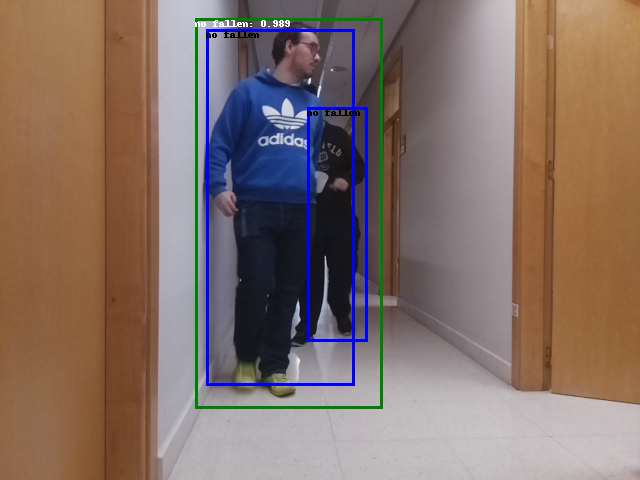

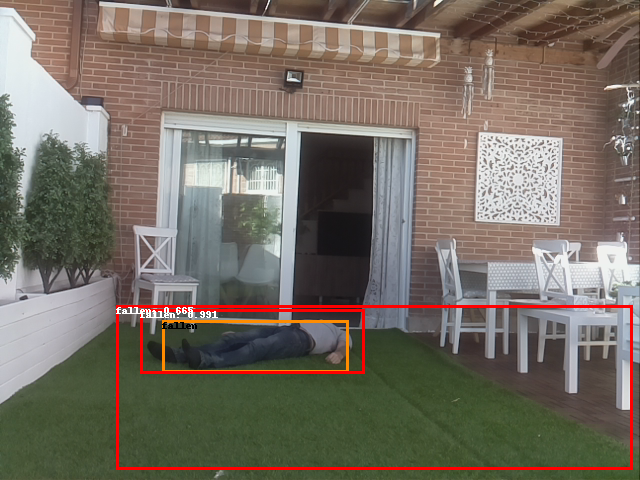

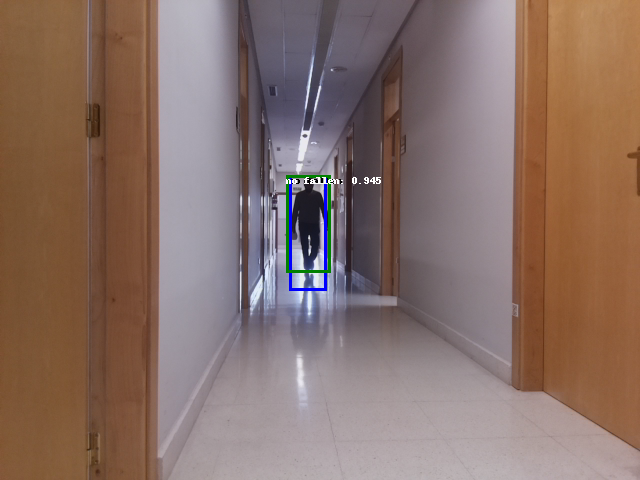

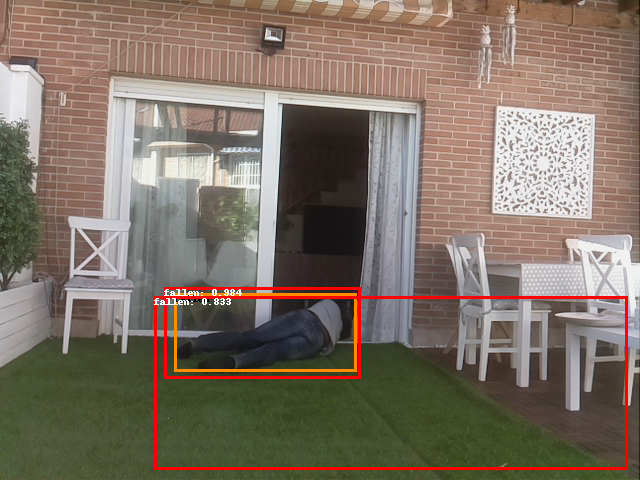

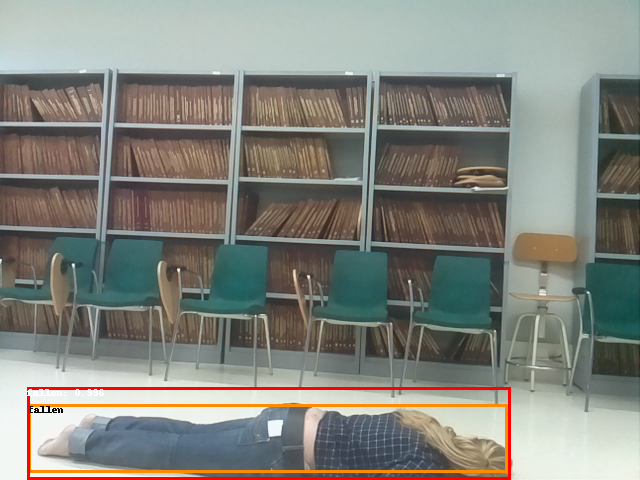

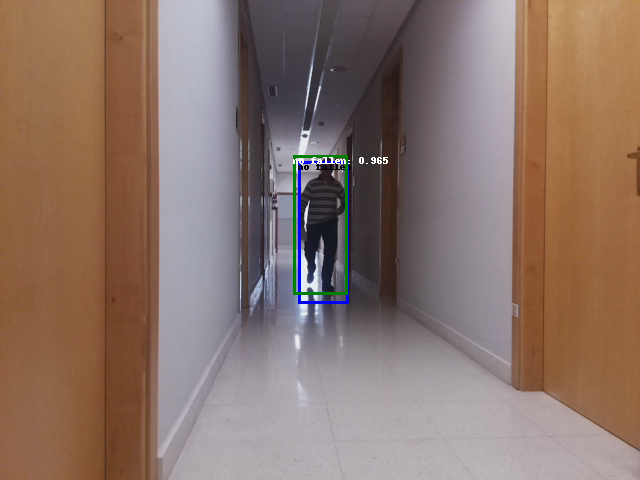

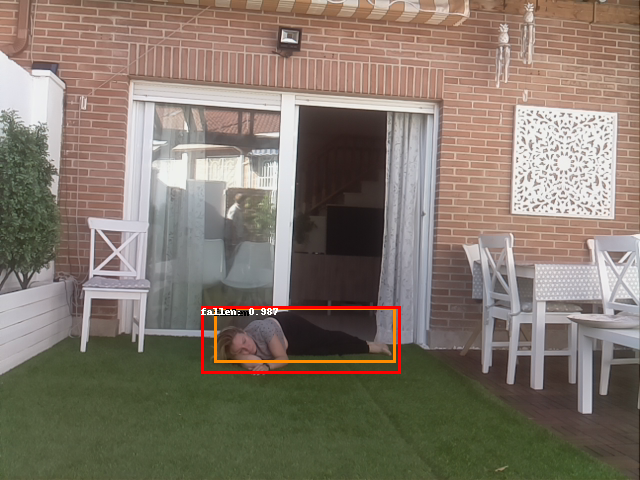

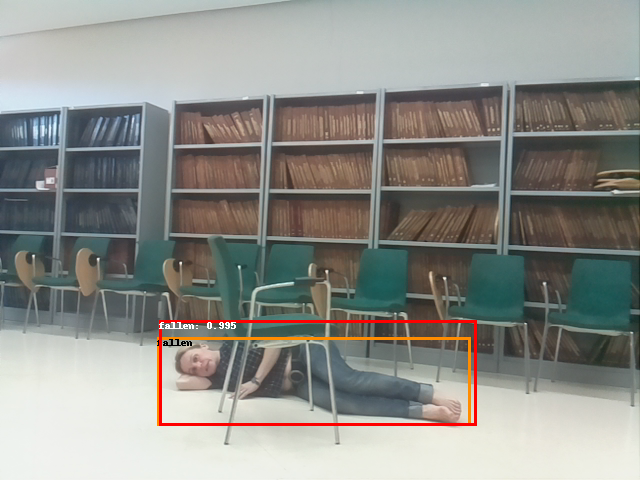

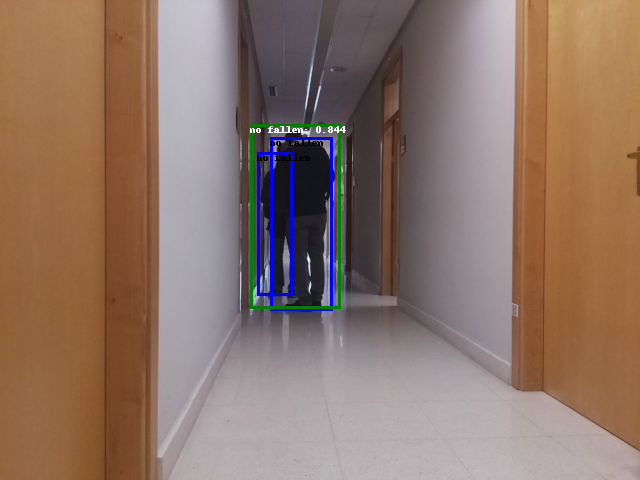

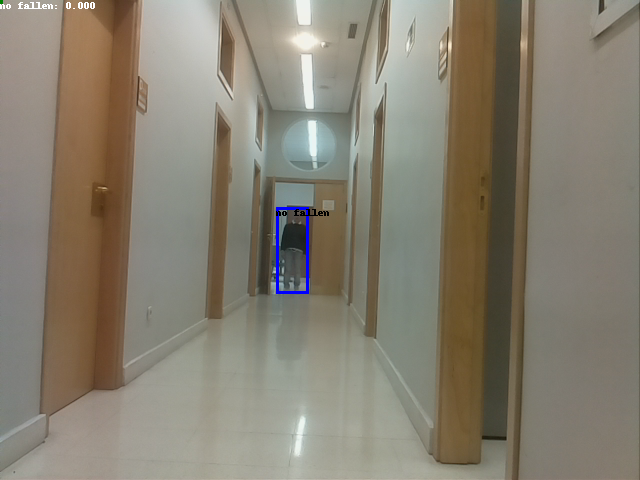

In [13]:
visualize_prediction(test_dataset, test_list, model_rov, device, path=None, thr=0.6)

## REAL OVER VIRTUAL RL

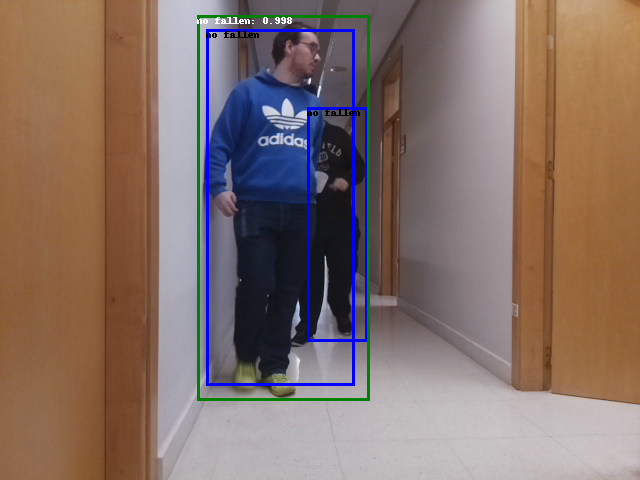

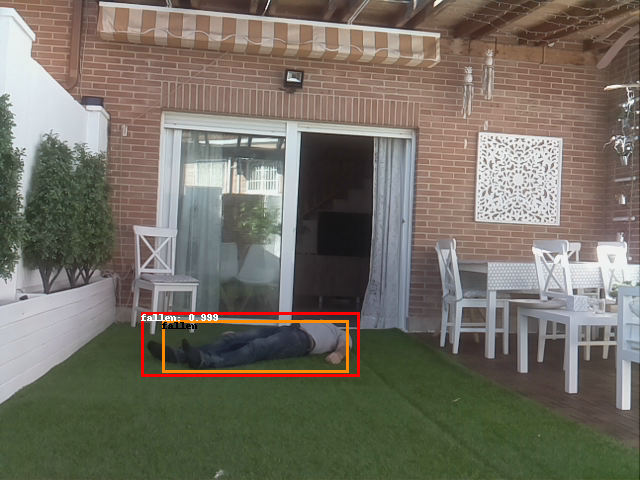

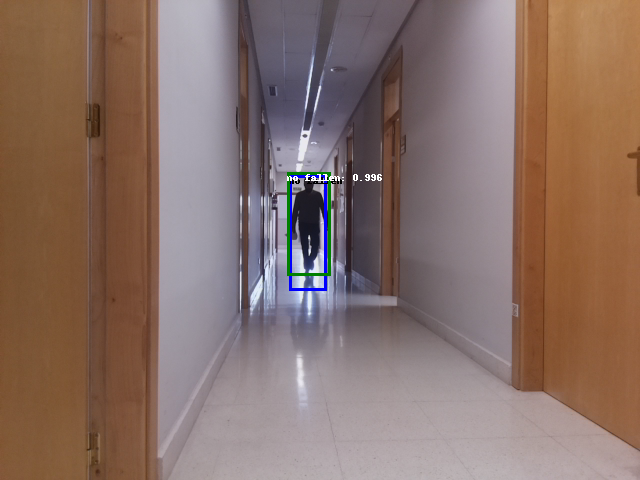

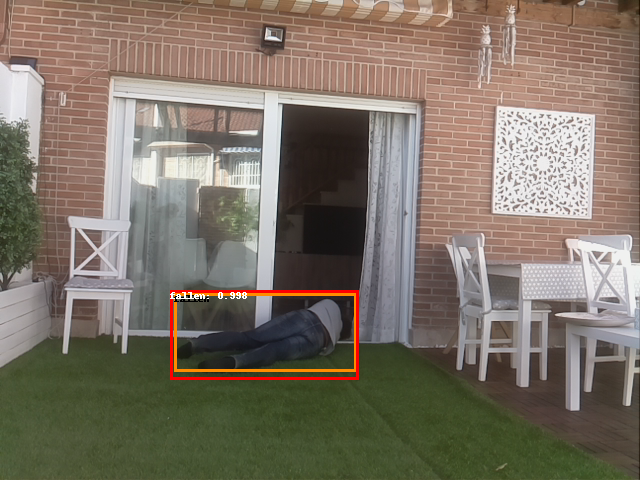

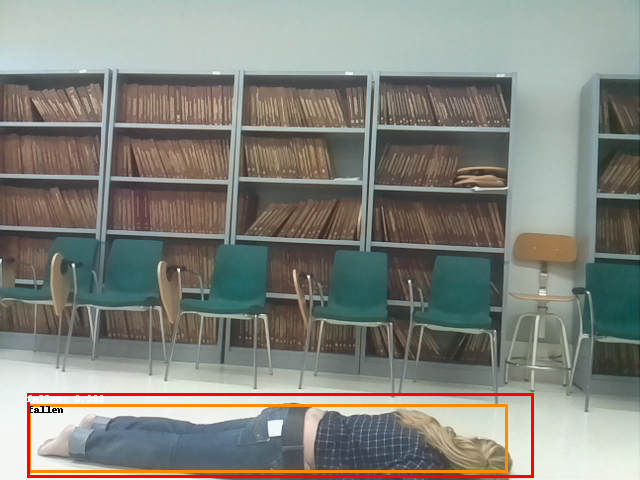

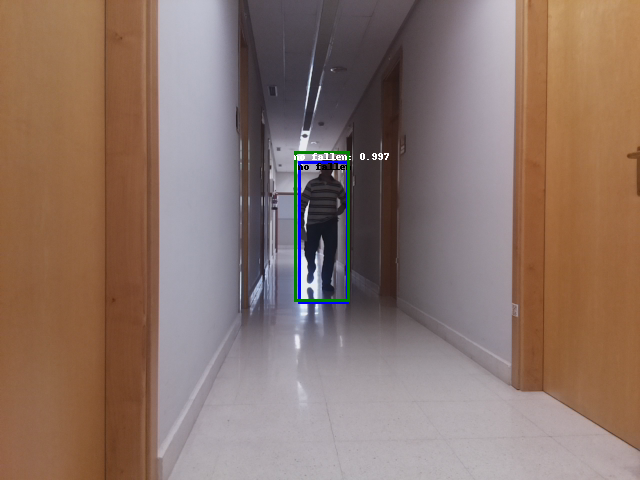

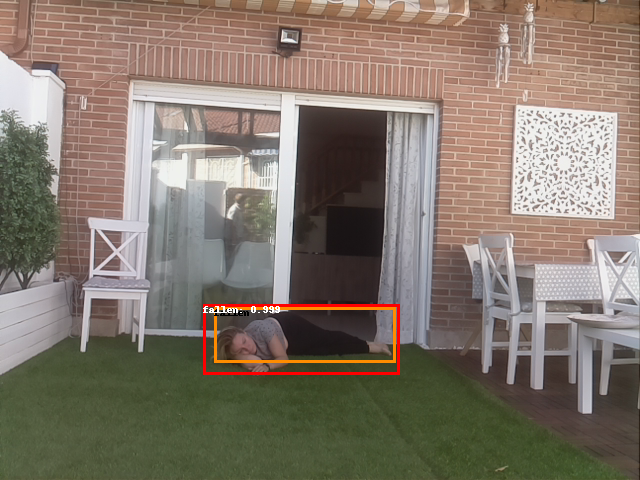

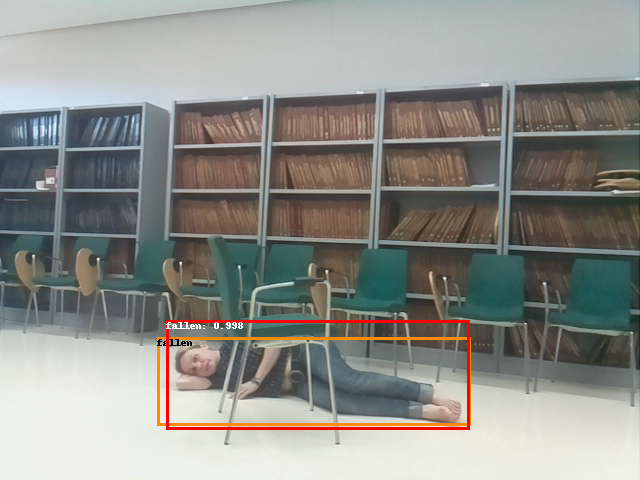

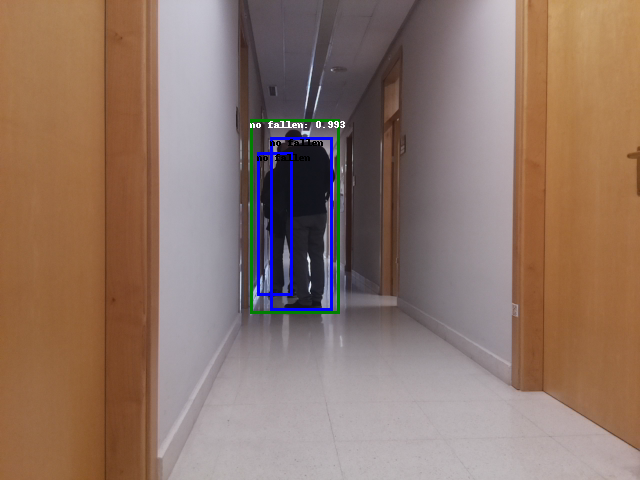

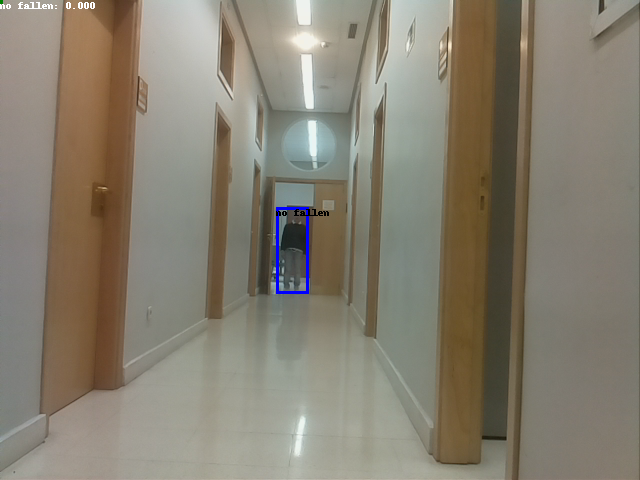

In [14]:
visualize_prediction(test_dataset, test_list, model_rov_lr, device, path=None, thr=0.8)

## VIRTUAL AND REAL

In [15]:
model_var_lr, _ = load_model("./models/checkpoint_train_virtual_and_real_with_lr_2.pth")

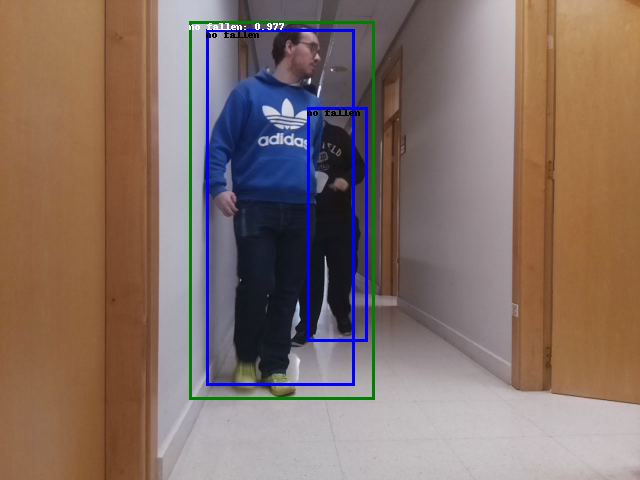

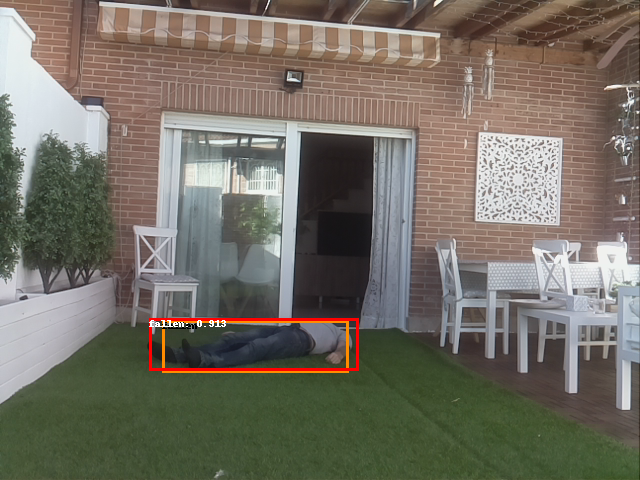

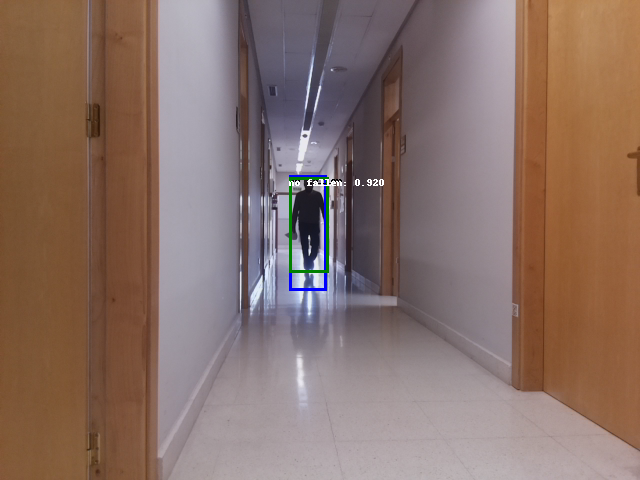

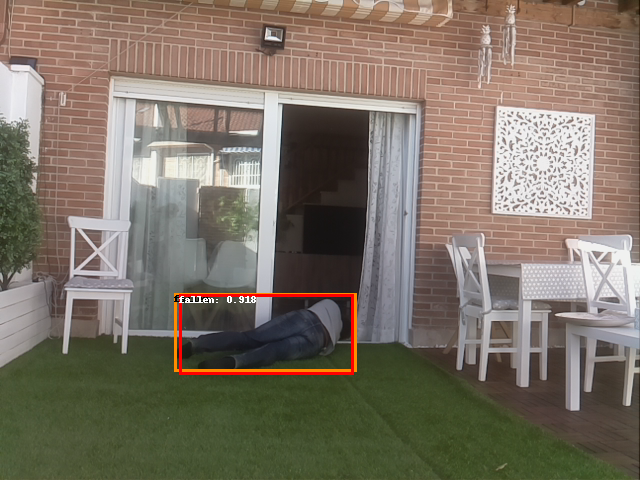

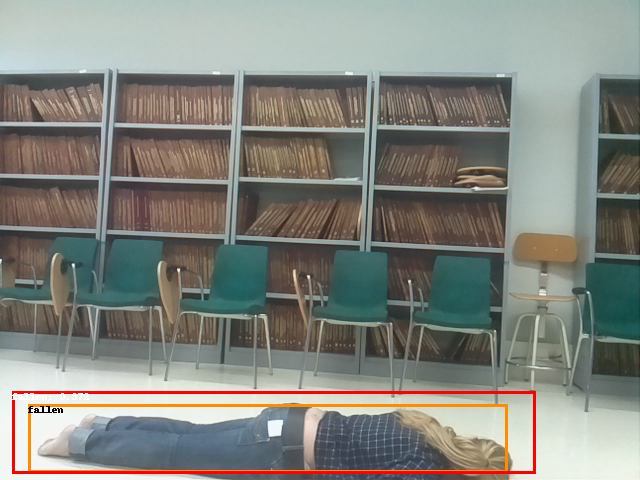

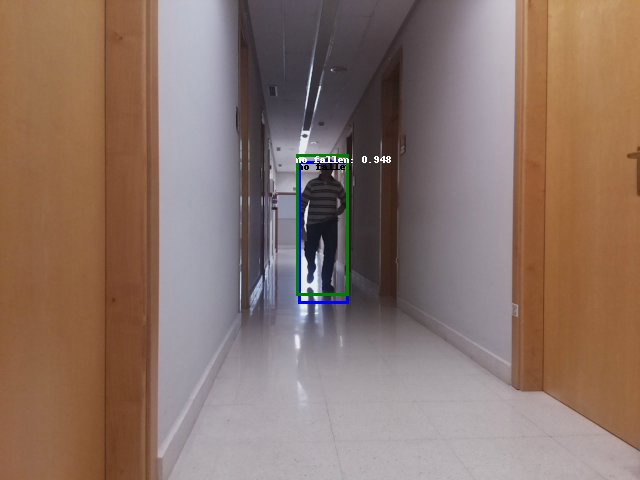

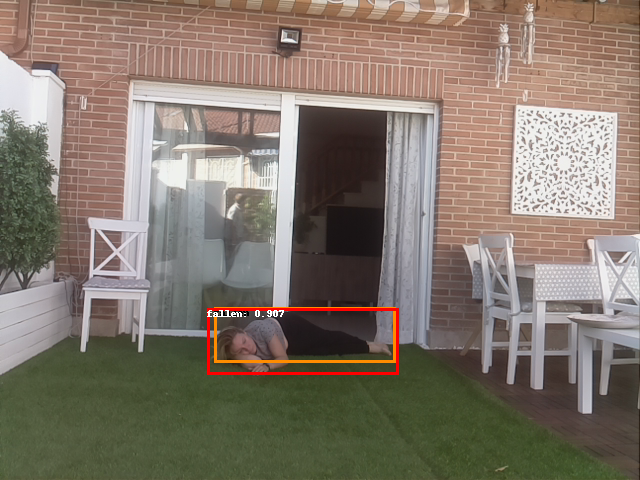

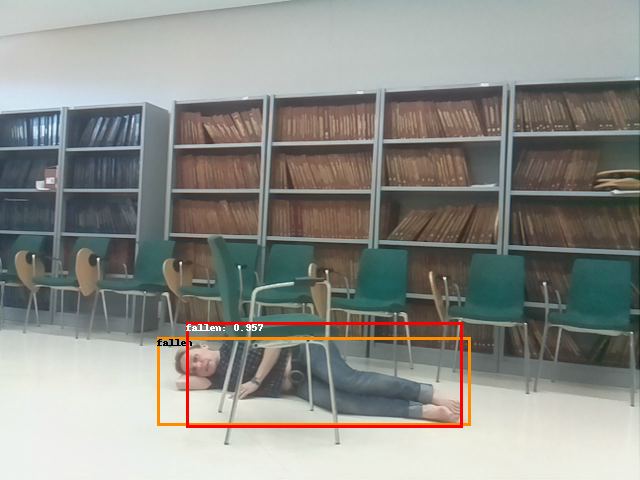

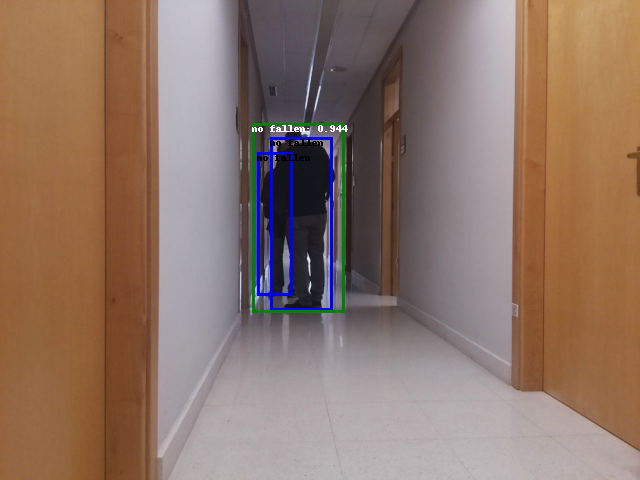

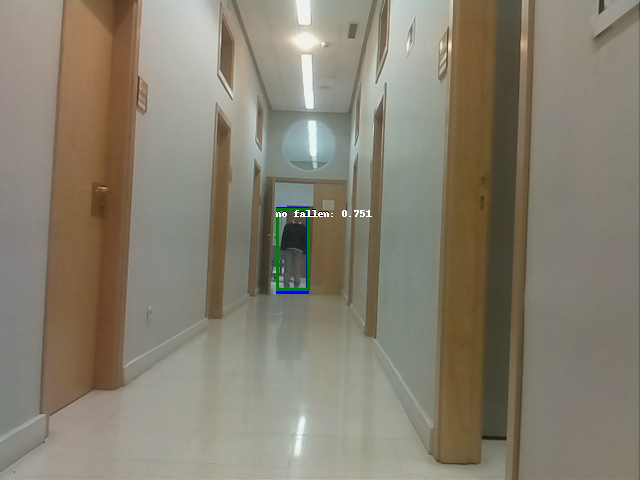

In [16]:
visualize_prediction(test_dataset, test_list, model_var, device, path=None, thr=0.6)

## VIRTUAL AND REAL RL

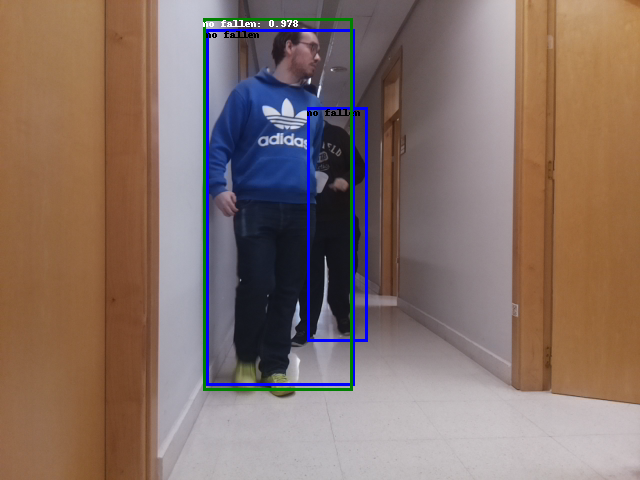

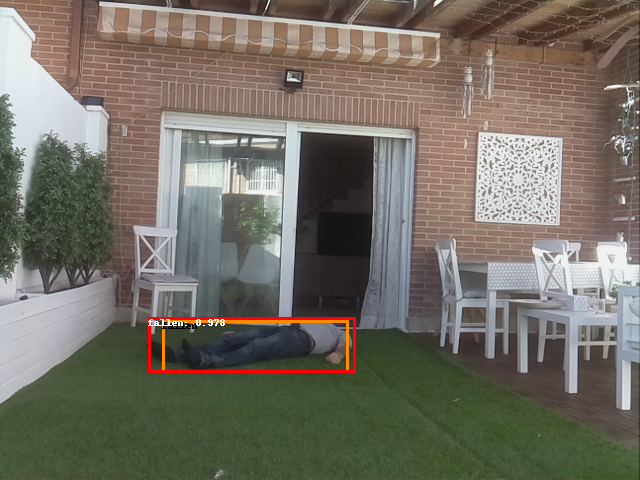

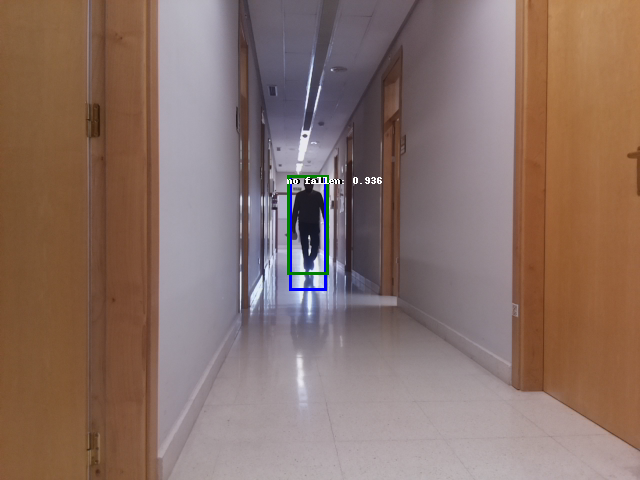

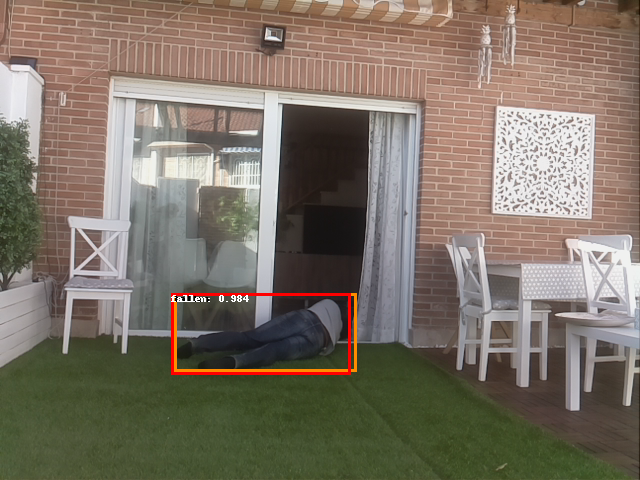

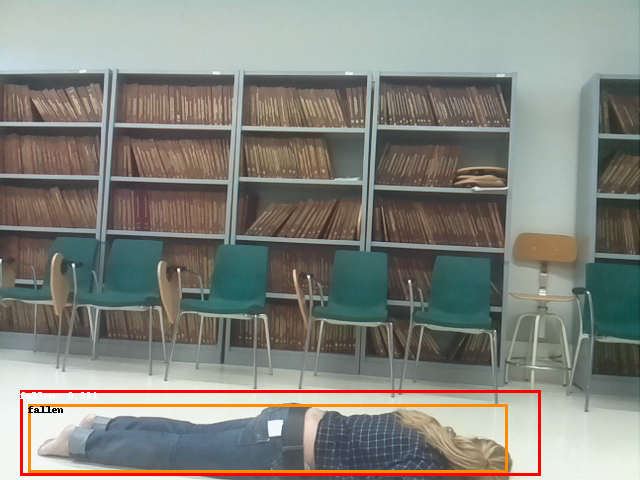

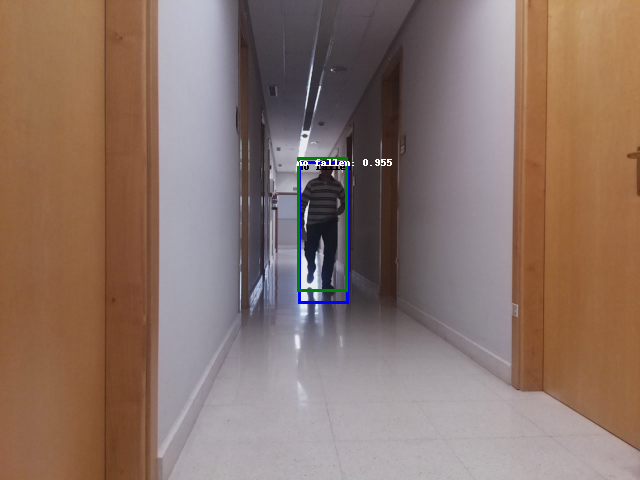

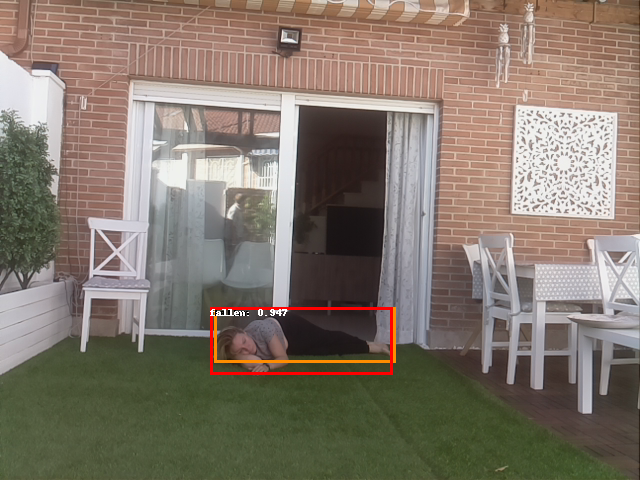

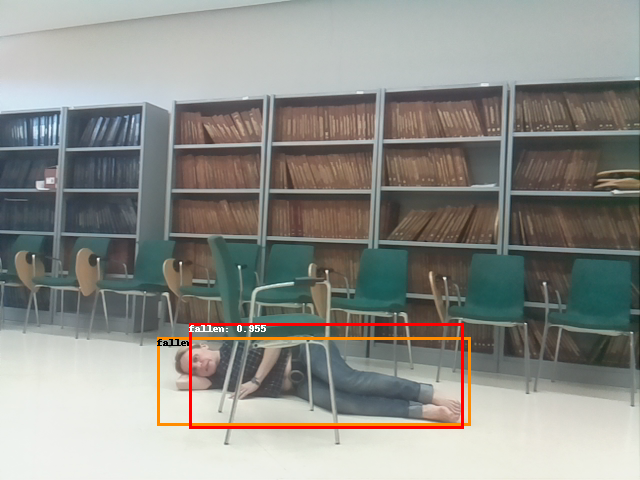

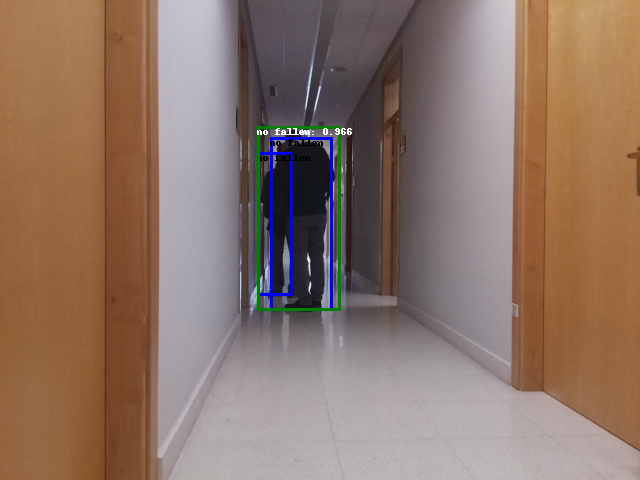

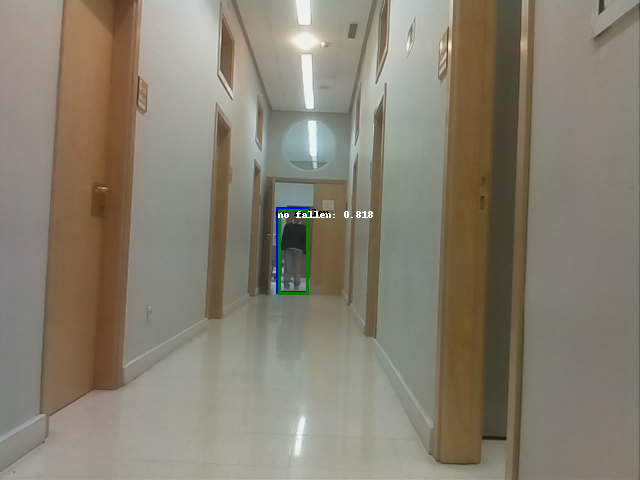

In [17]:
visualize_prediction(test_dataset, test_list, model_var_lr, device, path=None, thr=0.8)

## REAL

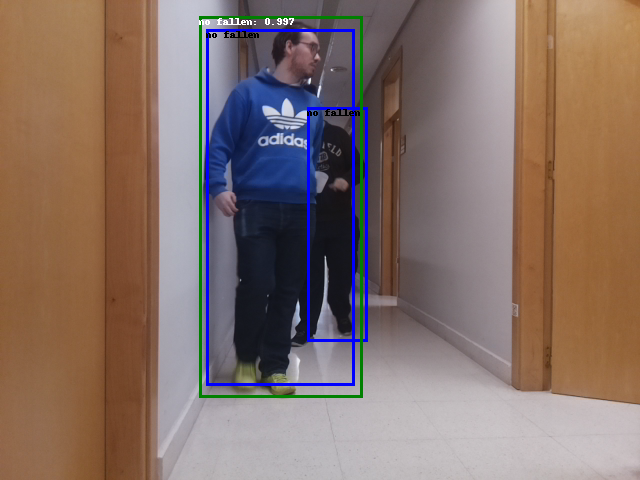

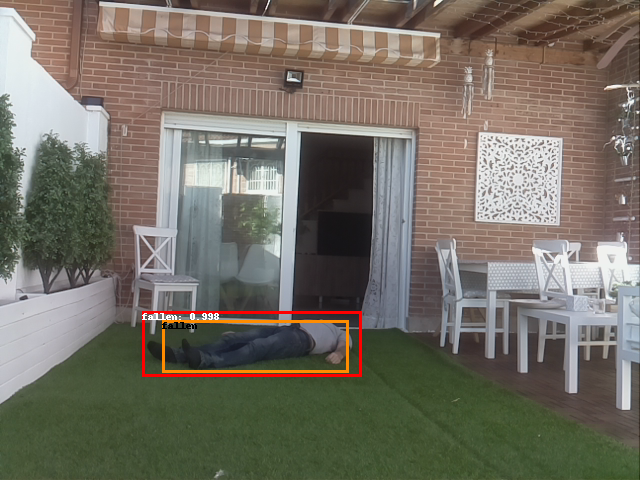

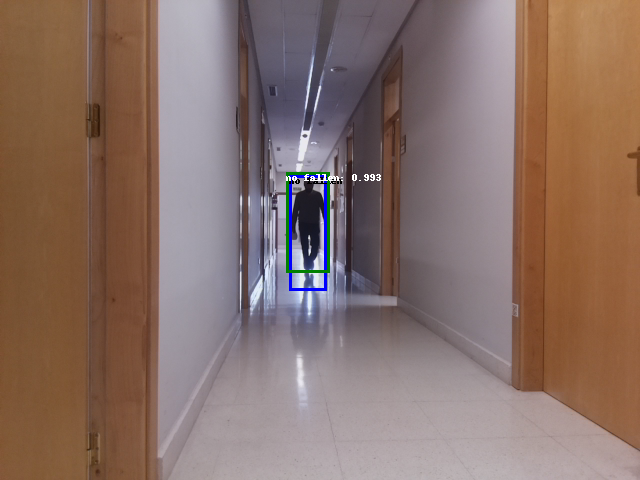

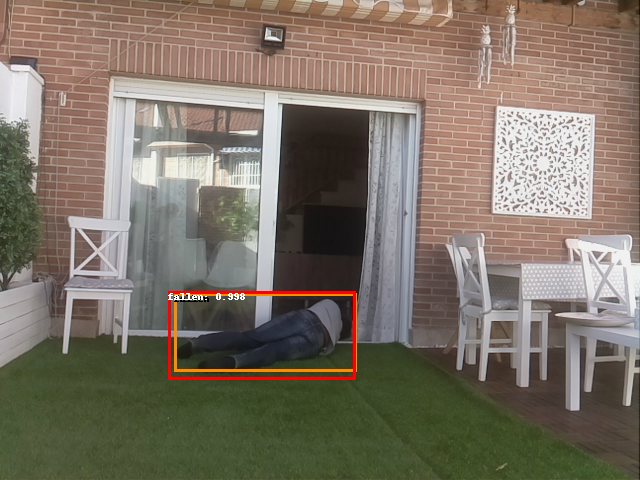

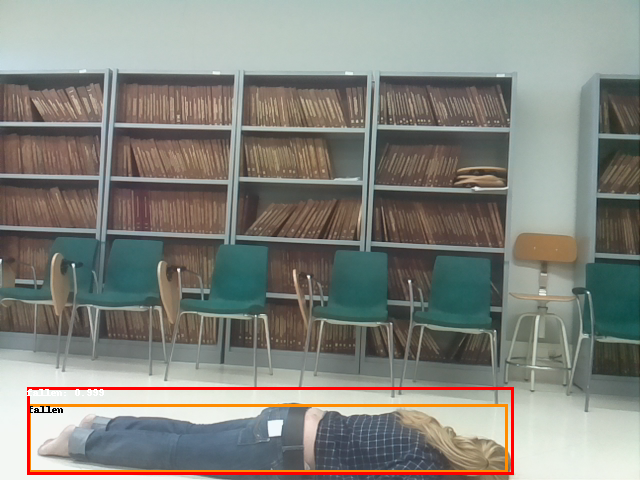

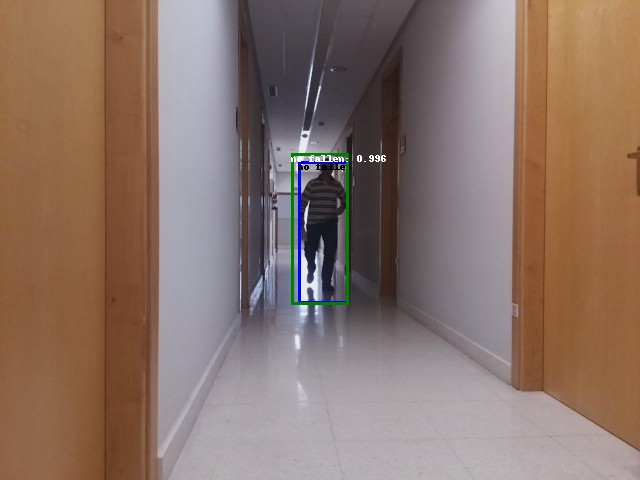

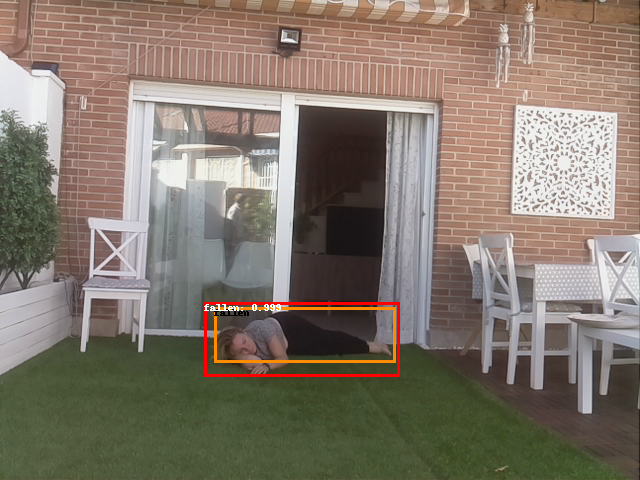

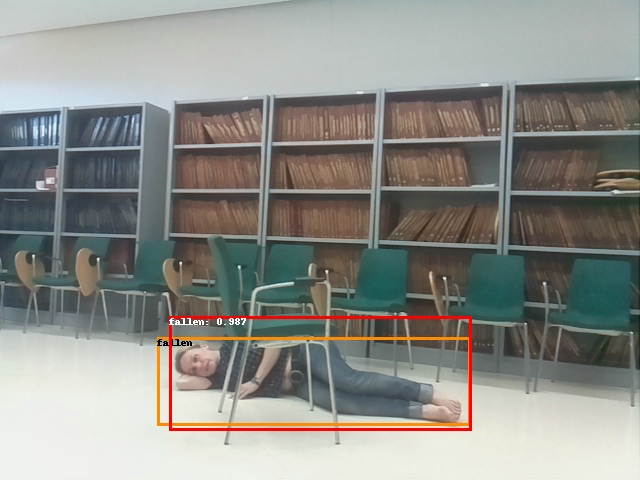

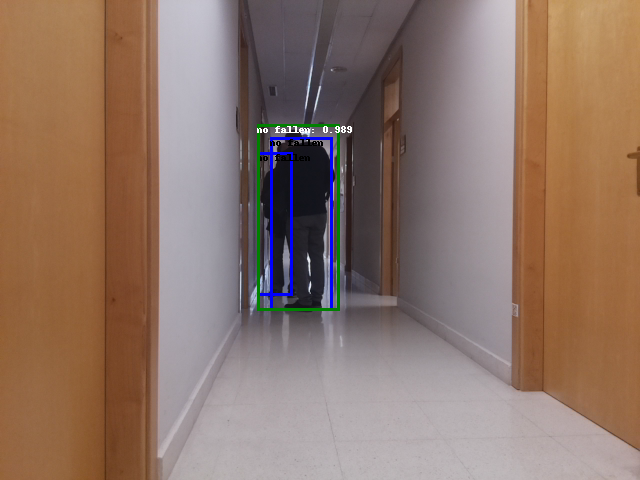

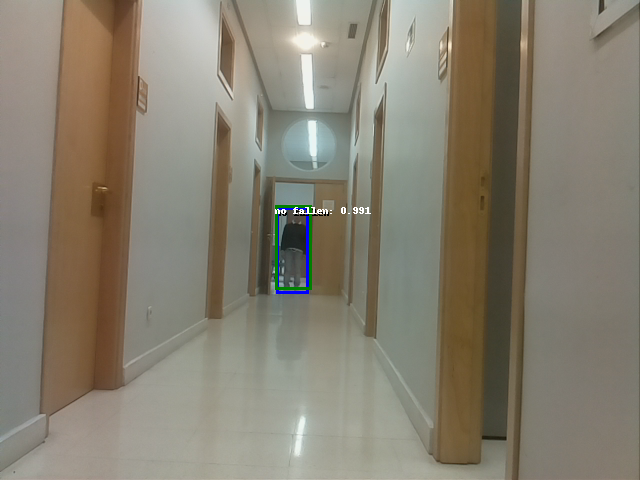

In [21]:
visualize_prediction(test_dataset, test_list, model_r, device, path=None, thr=0.5)